In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U layoutparser

     |████████████████████████████████| 19.2 MB 1.4 MB/s 
     |████████████████████████████████| 596 kB 56.2 MB/s 
     |████████████████████████████████| 46 kB 3.7 MB/s 
     |████████████████████████████████| 5.6 MB 58.7 MB/s 
     |████████████████████████████████| 4.3 MB 41.7 MB/s 
     |████████████████████████████████| 139 kB 52.6 MB/s 
     |████████████████████████████████| 3.6 MB 57.2 MB/s 
  Created wheel for pdfplumber: filename=pdfplumber-0.6.0-py3-none-any.whl size=33688 sha256=e6182f8f97e1e3fe2a20c37e4ebea5a8bd2d3459164411c3e9ea526f14b19a54
  Stored in directory: /root/.cache/pip/wheels/58/56/fe/2e93d842ffa9ea97746c1ab253d43502ed61c0689361a0224e
Successfully built pdfplumber
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git@v0.4#egg=detectron2'

  Cloning https://github.com/facebookresearch/detectron2.git (to revision v0.4) to /tmp/pip-install-qck7hdpi/detectron2_6bf1af9ea3c3441e800e42d13ff099a0
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-install-qck7hdpi/detectron2_6bf1af9ea3c3441e800e42d13ff099a0
  Running command git checkout -q 4aca4bdaa9ad48b8e91d7520e0d0815bb8ca0fb1
     |████████████████████████████████| 47 kB 2.4 MB/s 
     |████████████████████████████████| 74 kB 1.9 MB/s 
     |████████████████████████████████| 112 kB 22.2 MB/s 
  Created wheel for detectron2: filename=detectron2-0.4-cp37-cp37m-linux_x86_64.whl size=5285381 sha256=e9cc02d4b24648dcfd1f839afa7d7f7861d6513b6e3418221543325632bab18f
  Stored in directory: /tmp/pip-ephem-wheel-cache-t94g7d58/wheels/87/3f/26/dc45098d34763c9dc05ea3ab35c6dec6e9e8c16ac741efb741
  Created wheel for fvcore: filename=fvcore-0.1.3.post20210317-py3-none-any.whl size=58542 sha256=2b1569f7c8c181b50240973eb1722ebdd824be8b4b435660d485d1fa0

In [ ]:
!pip install layoutparser[ocr]

     |████████████████████████████████| 435 kB 4.3 MB/s 


In [ ]:
!git clone https://github.com/Layout-Parser/layout-parser.git

Cloning into 'layout-parser'...
remote: Enumerating objects: 1274, done.
remote: Counting objects: 100% (780/780), done.
remote: Compressing objects: 100% (438/438), done.
remote: Total 1274 (delta 446), reused 551 (delta 278), pack-reused 494
Receiving objects: 100% (1274/1274), 67.78 MiB | 14.40 MiB/s, done.
Resolving deltas: 100% (675/675), done.


In [ ]:
%cd layout-parser/

/content/layout-parser


In [ ]:
import cv2
image = cv2.imread("/content/andhra1bsimgoutput1.jpg")
image = image[..., ::-1]

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:101: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


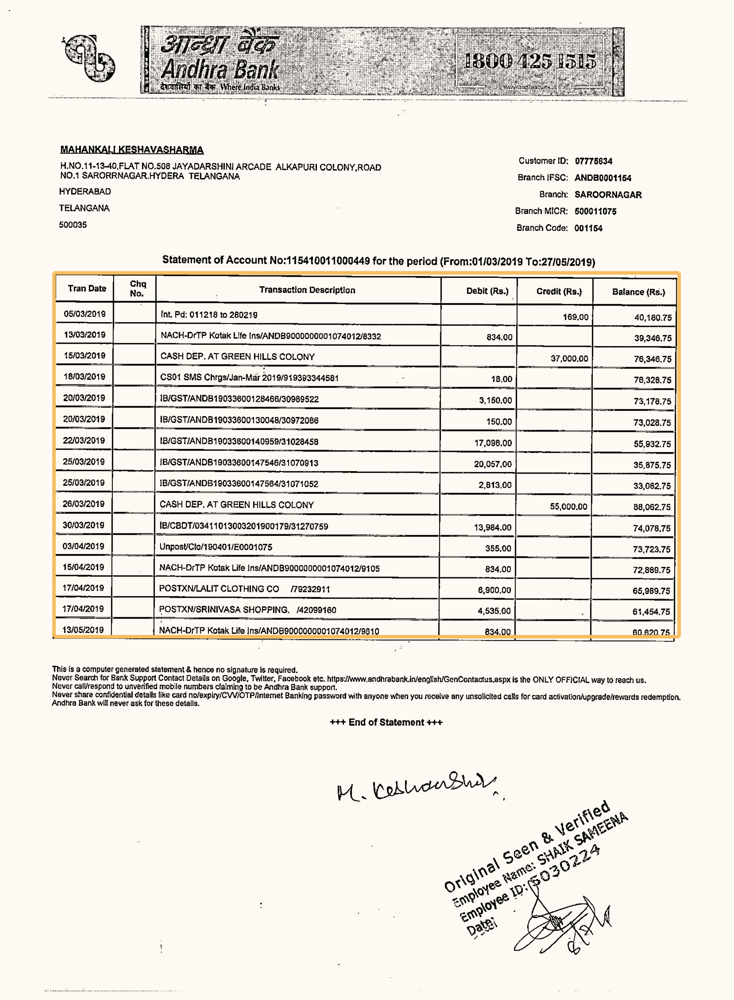

In [ ]:
import layoutparser as lp
model = lp.Detectron2LayoutModel('lp://TableBank/faster_rcnn_R_101_FPN_3x/config',extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.65],
                                 label_map={0: "Table"})
layout = model.detect(image) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
lp.draw_box(image, layout,)

In [ ]:
text_blocks = lp.Layout([b for b in layout if b.type=="Table"])
text_blocks

Layout(_blocks=[TextBlock(block=Rectangle(x_1=305.6894836425781, y_1=1538.546875, x_2=3834.653076171875, y_2=3591.9912109375), text=None, id=None, type=Table, parent=None, next=None, score=0.9921464323997498)], page_data={})

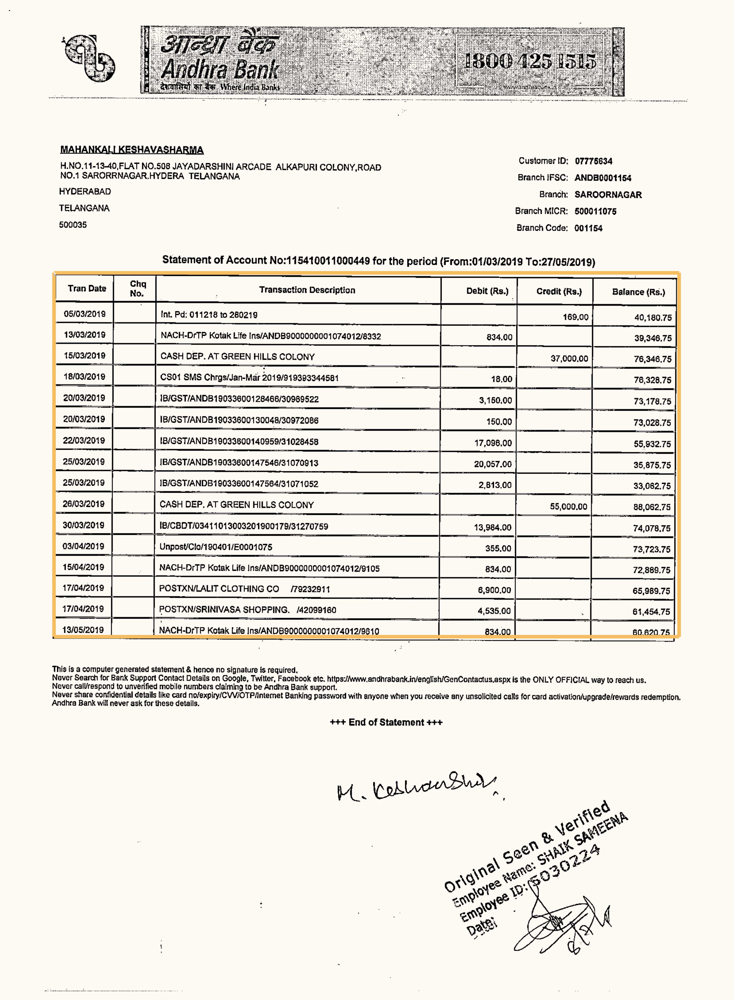

In [ ]:
lp.draw_box(image, layout ,
            show_element_id=True)


In [ ]:
ocr_agent = lp.TesseractAgent(languages='eng') 

In [ ]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 39 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 3s (1,737 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [ ]:
for block in layout:
    segment_image = (block
                       .pad(left=5, right=5, top=5, bottom=5)
                       .crop_image(image))
       
        
    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)

In [ ]:
for txt in layout.get_texts():
    print(txt, end='\n---\n')

05/03/2019 |] Int. Pd: 011218 to 280219 [| 169,00 40,180.75
13/03/2019 NACH-DrTP Kotak Life Ins/ANDB9000000001074012/8332 834.00

15/03/2019 CASH DEP. AT GREEN HILLS COLONY

48/03/2019 || CS01 SMS Chrgs/Jan-Mar 2019/919393344581
20/03/2019 | IB/GST/ANDB190336001 28466/30969522

20/03/2019 | IB/GST/ANDB19033600130048/30972086

} zamsote | IB/GST/ANDB19033600140959/3 1028458
25/03/2019 IB/GST/ANDB19033600147546/31070913

| zeoazoe | CASH DEP, AT GREEN HILLS COLONY

| sowsmore | IB/CBDT/03411013003201900179/31270759

03/04/2019 po Unpost/Clo/190401/E0001075

15/04/2019 | | NACH-DrTP Kotak Life Ins‘/ANDB9000000001074012/9105

17/04/2019 Fy POSTXN/LALIT CLOTHING CO /79232911
47/04/2019 } POSTXN/SRINIVASA SHOPPING. /42099160

13/05/2019 NACH-DrTP Kotak Life Ins/ANDB9000000001074012/9610 834.00 60,620.75

39,346.75

   
   

 

37,000.00

f
f

76,346.75

  
  

 

 

   
 

      

 
  

76,328.75

 
    
  
 

 

 

 

 

73,178.75

 
  
 
 

   
 
 

3,150.00

73,028.75

 

 

   

17,096.0